---
  Authors: Connor Amato and Sho Takeshita
  Title: Enzyme Stability Regression
---
Novozymes Enzyme Stability Prediction Kaggle Competition

## Motivation
In industry, enzymes replace chemicals and accelerate production processes. Understanding enzyme stability is a problem in biotechnology, which could help reduce waste, lower costs, and increase production speed.

## Overview
Our goal is to predict the thermostability of proteins, which is measured by their melting points, after single point amino acid mutations and deletions. The relationship between protein type and thermostability is not straightforward, but the amount of disorder (e.g. mutation) in a protein sequence is the main factor according to this publication supplied by the competition: https://www.nature.com/articles/s41592-020-0801-4.  

## The Dataset
This kaggle competition gives us a training and a test dataset. The dataset contains around 31 thousand records of the variant for one enzyme, sourced from an attempt to atlas the thermal stability of proteins across different types of proteins. The datasets contain for each protein their sequence id (identifies each protein variant), protein sequence (amino acid sequence), pH at which the stability was measured, thermostability (melting point), and a link to the source of the data. The training set includes normal sequences as well as sequences with single or multiple mutations. The submission to the competition is a csv file with the test set along with the classified thermostability. This is a continuous data point so we will be applying some sort of regression model.
## Reading the Data

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt #Imported basic libraries
import seaborn as sns
import sklearn as sk
from google.colab import drive
from google.colab import files

files.upload()


Saving test.csv to test.csv
Saving train.csv to train.csv
Saving train_updates_20220929.csv to train_updates_20220929.csv


{'test.csv': b'seq_id,protein_sequence,pH,data_source\n31390,VPVNPEPDATSVENVAEKTGSGDSQSDPIKADLEVKGQSALPFDVDCWAILCKGAPNVLQRVNEKTKNSNRDRSGANKGPFKDPQKWGIKALPPKNPSWSAQDFKSPEEYAFASSLQGGTNAILAPVNLASQNSQGGVLNGFYSANKVAQFDPSKPQQTKGTWFQITKFTGAAGPYCKALGSNDKSVCDKNKNIAGDWGFDPAKWAYQYDEKNNKFNYVGK,8,Novozymes\n31391,VPVNPEPDATSVENVAKKTGSGDSQSDPIKADLEVKGQSALPFDVDCWAILCKGAPNVLQRVNEKTKNSNRDRSGANKGPFKDPQKWGIKALPPKNPSWSAQDFKSPEEYAFASSLQGGTNAILAPVNLASQNSQGGVLNGFYSANKVAQFDPSKPQQTKGTWFQITKFTGAAGPYCKALGSNDKSVCDKNKNIAGDWGFDPAKWAYQYDEKNNKFNYVGK,8,Novozymes\n31392,VPVNPEPDATSVENVAKTGSGDSQSDPIKADLEVKGQSALPFDVDCWAILCKGAPNVLQRVNEKTKNSNRDRSGANKGPFKDPQKWGIKALPPKNPSWSAQDFKSPEEYAFASSLQGGTNAILAPVNLASQNSQGGVLNGFYSANKVAQFDPSKPQQTKGTWFQITKFTGAAGPYCKALGSNDKSVCDKNKNIAGDWGFDPAKWAYQYDEKNNKFNYVGK,8,Novozymes\n31393,VPVNPEPDATSVENVALCTGSGDSQSDPIKADLEVKGQSALPFDVDCWAILCKGAPNVLQRVNEKTKNSNRDRSGANKGPFKDPQKWGIKALPPKNPSWSAQDFKSPEEYAFASSLQGGTNAILAPVNLASQNSQGGVLNGFYSANKVAQFDPSKPQQTKGTWFQITKFTGAAGPYCKALGSNDKSVCDKNKNIAGDWGFDPAKWAYQYDEKNNKFN

In [ ]:
df = pd.read_csv("train.csv")
df.head(5)

,seq_id,protein_sequence,pH,data_source,tm
0,0,AAAAKAAALALLGEAPEVVDIWLPAGWRQPFRVFRLERKGDGVLVG...,7.0,doi.org/10.1038/s41592-020-0801-4,75.7
1,1,AAADGEPLHNEEERAGAGQVGRSLPQESEEQRTGSRPRRRRDLGSR...,7.0,doi.org/10.1038/s41592-020-0801-4,50.5
2,2,AAAFSTPRATSYRILSSAGSGSTRADAPQVRRLHTTRDLLAKDYYA...,7.0,doi.org/10.1038/s41592-020-0801-4,40.5
3,3,AAASGLRTAIPAQPLRHLLQPAPRPCLRPFGLLSVRAGSARRSGLL...,7.0,doi.org/10.1038/s41592-020-0801-4,47.2
4,4,AAATKSGPRRQSQGASVRTFTPFYFLVEPVDTLSVRGSSVILNCSA...,7.0,doi.org/10.1038/s41592-020-0801-4,49.5


In [ ]:
df = df.drop("data_source", axis = 1) #This column is not useful to classification
print(len(df[df["protein_sequence"].isnull()]),
len(df[df["tm"].isnull()]),
len(df[df["pH"].isnull()])) 
# Each remaining column is perfect except for the 286 missing pH values

0 0 286


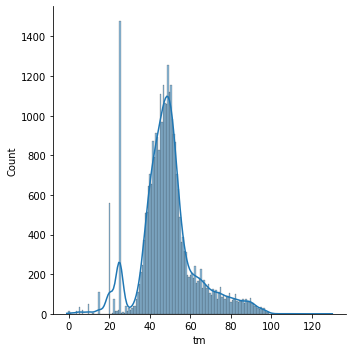

In [ ]:
sns.displot(df['tm'], kde=True) # Let's see the distribution of the classifications 
#(tm is the enzyme melting point and is a measure of stability)

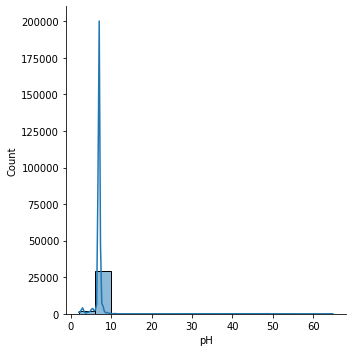

In [ ]:
sns.displot(df['pH'], kde=True)

In [ ]:
print(len(df), " Total Columns vs ", len(df["protein_sequence"].unique()), " Unique Sequences")

31390  Total Columns vs  28981  Unique Sequences


In [ ]:
# This is the base wild type sequence provided in the description of the competition

base = 'VPVNPEPDATSVENVALKTGSGDSQSDPIKADLEVKGQSALPFDVDCWAILCKGAPNVLQRVNEKTKNSNRDRSGANKGPFKDPQKWGIKALPPKNPSWSAQDFKSPEEYAFASSLQGGTNAILAPVNLASQNSQGGVLNGFYSANKVAQFDPSKPQQTKGTWFQITKFTGAAGPYCKALGSNDKSVCDKNKNIAGDWGFDPAKWAYQYDEKNNKFNYVGK'

## Parsing
The protein sequence feature is almost entirely made of of unique values, so we need to parse this into multiple more useful features. To do this, we will employ the PyRosseta library, which supplies funcitonality for dealing with molecular biology information. 

In [ ]:
!pip install pyrosettacolabsetup
import pyrosettacolabsetup; pyrosettacolabsetup.install_pyrosetta()
import pyrosetta; pyrosetta.init()
